# Student Information

## Name:

## Student ID:

## GitHub ID:

In [1]:
# import library
import pandas as pd
import numpy as np
import nltk
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy
from sklearn.preprocessing import binarize
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB, GaussianNB
import plotly as py
import math
import PAMI
from PAMI.extras.DF2DB import DenseFormatDF as db
from PAMI.extras.dbStats import TransactionalDatabase as tds
from PAMI.frequentPattern.basic import FPGrowth as alg
import umap
import matplotlib.pyplot as plt
import seaborn as sns
import helpers.data_mining_helpers as dmh
from collections import Counter
from wordcloud import WordCloud
import string
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# TEST necessary for when working with external scripts
%load_ext autoreload
%autoreload 2

# First Part

In [3]:
# df for exercises
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']
twenty_train = fetch_20newsgroups(
    subset='train', 
    categories=categories,
    shuffle=True, 
    random_state=42
)

X = pd.DataFrame.from_records(dmh.format_rows(twenty_train), columns= ['text'])
X['category'] = twenty_train.target
X['category_name'] = X.category.apply(lambda X: dmh.format_labels(X, twenty_train))

## Exercise 2

***Experiment with other querying techniques using pandas dataframes.***

### Selecting random samples

In [4]:
# default
X.sample()

,text,category,category_name
1988,From: Donald Mackie <Donald_Mackie@med.umich.e...,2,sci.med


In [5]:
# specific number of rows
X.sample(3)

,text,category,category_name
583,From: bytor@cruzio.santa-cruz.ca.us Subject: L...,2,sci.med
2185,From: freemant@dcs.glasgow.ac.uk (Toby Freeman...,1,comp.graphics
1492,From: raynor@cs.scarolina.edu (Harold Brian Ra...,1,comp.graphics


### The where() Method

In [6]:
s = X.loc[:10, 'category']

In [7]:
# return only the selected rows
s[s == 3]

2     3
3     3
4     3
5     3
6     3
10    3
Name: category, dtype: int64

In [8]:
# return a Series of the same shape as the original
s.where(s == 3)

0     NaN
1     NaN
2     3.0
3     3.0
4     3.0
5     3.0
6     3.0
7     NaN
8     NaN
9     NaN
10    3.0
Name: category, dtype: float64

In [9]:
X.where( X == 'sci.med')

,text,category,category_name
0,NaN,NaN,NaN
1,NaN,NaN,NaN
2,NaN,NaN,NaN
3,NaN,NaN,NaN
4,NaN,NaN,NaN
...,...,...,...
2252,NaN,NaN,sci.med
2253,NaN,NaN,sci.med
2254,NaN,NaN,sci.med
2255,NaN,NaN,sci.med


In [10]:
# mask() is the inverse boolean operation of where.
X.mask( X == 'sci.med')

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
...,...,...,...
2252,From: roos@Operoni.Helsinki.FI (Christophe Roo...,2,NaN
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2,NaN
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2,NaN
2255,From: Dan Wallach <dwallach@cs.berkeley.edu> S...,2,NaN


### The query() Method

In [11]:
# selection using an expression
X.query('(category != 1) & (category_name != "soc.religion.christian")')

,text,category,category_name
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med
12,From: I3150101@dbstu1.rz.tu-bs.de (Benedikt Ro...,0,alt.atheism
13,Subject: So what is Maddi? From: madhaus@netco...,0,alt.atheism
...,...,...,...
2252,From: roos@Operoni.Helsinki.FI (Christophe Roo...,2,sci.med
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2,sci.med
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2,sci.med
2255,From: Dan Wallach <dwallach@cs.berkeley.edu> S...,2,sci.med


In [12]:
# in comparison operator
X.query('category in (1,2)')

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med
...,...,...,...
2252,From: roos@Operoni.Helsinki.FI (Christophe Roo...,2,sci.med
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2,sci.med
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2,sci.med
2255,From: Dan Wallach <dwallach@cs.berkeley.edu> S...,2,sci.med


In [13]:
X.query('category_name in ("comp.graphics","sci.med")')

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med
...,...,...,...
2252,From: roos@Operoni.Helsinki.FI (Christophe Roo...,2,sci.med
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2,sci.med
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2,sci.med
2255,From: Dan Wallach <dwallach@cs.berkeley.edu> S...,2,sci.med


In [14]:
# not in comparison operator
X.query('category not in (1,2)')

,text,category,category_name
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian
...,...,...,...
2237,From: datepper@phoenix.Princeton.EDU (David Aa...,0,alt.atheism
2246,From: lmvec@westminster.ac.uk (William Hargrea...,3,soc.religion.christian
2247,From: daniels@math.ufl.edu (TV's Big Dealer) S...,3,soc.religion.christian
2249,From: shellgate!llo@uu4.psi.com (Larry L. Over...,3,soc.religion.christian


In [15]:
X.query('category_name not in ("comp.graphics","sci.med")')

,text,category,category_name
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian
...,...,...,...
2237,From: datepper@phoenix.Princeton.EDU (David Aa...,0,alt.atheism
2246,From: lmvec@westminster.ac.uk (William Hargrea...,3,soc.religion.christian
2247,From: daniels@math.ufl.edu (TV's Big Dealer) S...,3,soc.religion.christian
2249,From: shellgate!llo@uu4.psi.com (Larry L. Over...,3,soc.religion.christian


## Exercise 5

There is an old saying that goes, "The devil is in the details." When we are working with extremely large data, it's difficult to check records one by one (as we have been doing so far). And also, we don't even know what kind of missing values we are
facing. Thus, "debugging" skills get sharper as we spend more time solving bugs. Let's focus on a different method to check for missing values and the kinds of missing values you may encounter. It's not easy to check for missing values as you will find
out in a minute.

***Please check the data and the process below, describe what you observe and why it happened.***

***why .isnull() didn't work?***

In [16]:
NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B' },
           { 'id': 'C', 'missing_example': 'NaN' },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example': None },
           { 'id': 'F', 'missing_example': '' }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df

,id,missing_example
0,A,NaN
1,B,NaN
2,C,NaN
3,D,None
4,E,None
5,F,


In [17]:
NA_df['missing_example'].isnull()

0     True
1     True
2    False
3    False
4     True
5    False
Name: missing_example, dtype: bool

## Exercise 6

***Notice any changes from the X dataframe to the X_sample dataframe? What are they? Report every change you noticed as compared to the previous state of X . Feel free to query and look more closely at the dataframe for these changes.***

In [18]:
X_sample = X.sample(n=1000) #random state

In [19]:
len(X_sample)

1000

In [20]:
X_sample.head(10)

,text,category,category_name
2233,From: kmr4@po.CWRU.edu (Keith M. Ryan) Subject...,0,alt.atheism
1077,From: REXLEX@fnal.fnal.gov Subject: Hell_2: B...,3,soc.religion.christian
1530,From: rgc3679@bcstec.ca.boeing.com (Robert G. ...,1,comp.graphics
1997,From: seth@north1.acpub.duke.edu (Seth Wanders...,1,comp.graphics
798,From: uabdpo.dpo.uab.edu!gila005 (Stephen Holl...,2,sci.med
1650,From: keith@cco.caltech.edu (Keith Allan Schne...,0,alt.atheism
860,From: aaron@binah.cc.brandeis.edu (Scott Aaron...,3,soc.religion.christian
1440,From: bil@okcforum.osrhe.edu (Bill Conner) Sub...,0,alt.atheism
1843,From: king@reasoning.com (Dick King) Subject: ...,2,sci.med
159,From: jhpb@sarto.budd-lake.nj.us (Joseph H. Bu...,3,soc.religion.christian


## Exercise 8

soc.religion.christian    599
sci.med                   594
comp.graphics             584
alt.atheism               480
Name: category_name, dtype: int64


<Axes: title={'center': 'Category distribution'}>

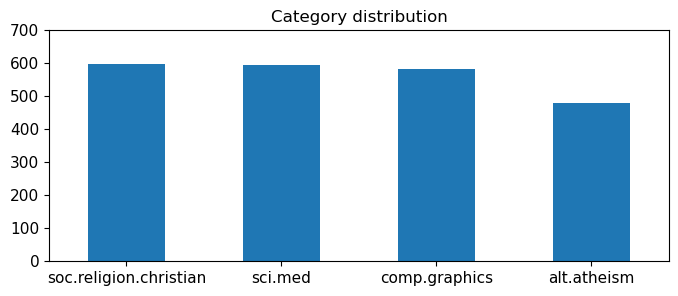

In [21]:
print(X.category_name.value_counts())

X.category_name.value_counts().plot(
    kind = 'bar',
    title = 'Category distribution',
    ylim = [0, 700],rot = 0, fontsize = 11, figsize = (8,3)
)

sci.med                   284
soc.religion.christian    262
comp.graphics             255
alt.atheism               199
Name: category_name, dtype: int64


<Axes: title={'center': 'Category distribution'}>

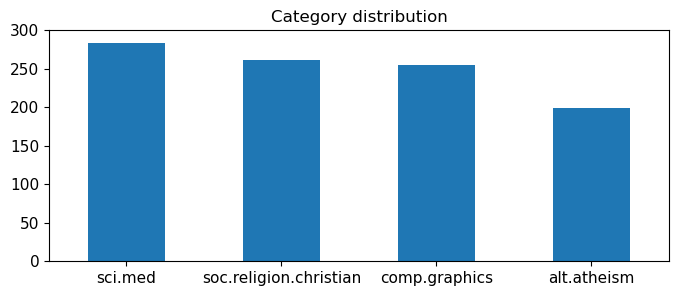

In [22]:
print(X_sample.category_name.value_counts())

# plot barchart for X_sample
X_sample.category_name.value_counts().plot(
    kind = 'bar',
    title = 'Category distribution',
    ylim = [0, 300],rot = 0, fontsize = 11, figsize = (8,3)
)

**We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for**

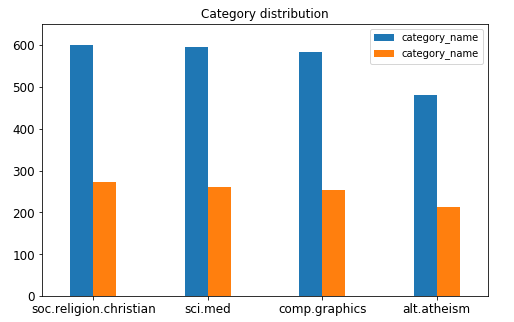

<Axes: title={'center': 'Category distribution'}>

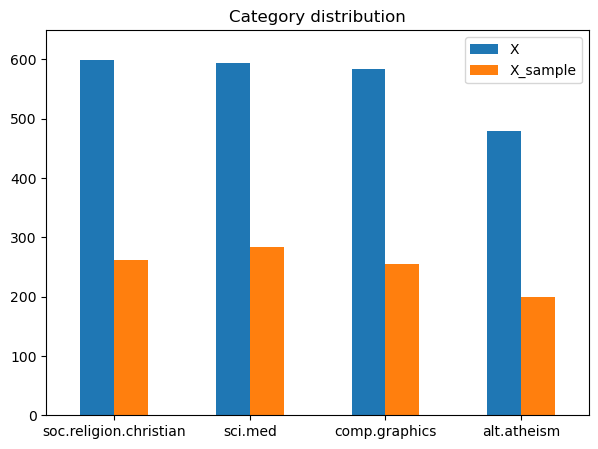

In [23]:
# concatenate 2 Series into a single DataFrame
cmp_df = pd.concat([X.category_name.value_counts(), X_sample.category_name.value_counts()], axis=1)

# set column names
cmp_df.columns = ['X', 'X_sample']

# maximum value for y
max_y = max(X.category_name.value_counts() + 50) 

# plot
cmp_df.plot(kind = 'bar',
            title = 'Category distribution',
            ylim = [0, max_y],
            rot = 0, fontsize = 10, figsize = (7,5))

## Exercise 10

In [24]:
count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text) #learn the vocabulary and return document-term matrix

In [25]:
X_counts[0:5, 0:100].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0,

In [26]:
count_vect.get_feature_names_out()[0:1]

array(['00'], dtype=object)

As you can see the result is just this huge sparse matrix, which is computationally intensive to generate and difficult to visualize. But we can see that the fifth record, specifically, contains a 1 in the beginning, which from our feature names we can deduce
that this article contains exactly one 00 term

***We said that the 1 at the beginning of the fifth record represents the 00 term. Notice that there is another 1 in the same record. Can you provide code that can verify what word this 1 represents from the vocabulary. Try to do this as efficient as
possible.***

In [27]:
# all words == 1 in the fifth record
count_vect.get_feature_names_out()[np.where(X_counts[0:5, 0:100].toarray()[4,] == 1)]

array(['00', '01'], dtype=object)

In [28]:
# second word == 1
count_vect.get_feature_names_out()[np.where(X_counts[0:5, 0:100].toarray()[4,] == 1)[0][1]]

'01'

## Exercise 11

In [29]:
# first twenty features only
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names_out()[0:20]]

# obtain document index
plot_y = ["doc_"+ str(i) for i in list(X.index)[0:20]]

plot_z = X_counts[0:20, 0:20].toarray() #X_counts[how many documents, how many terms]

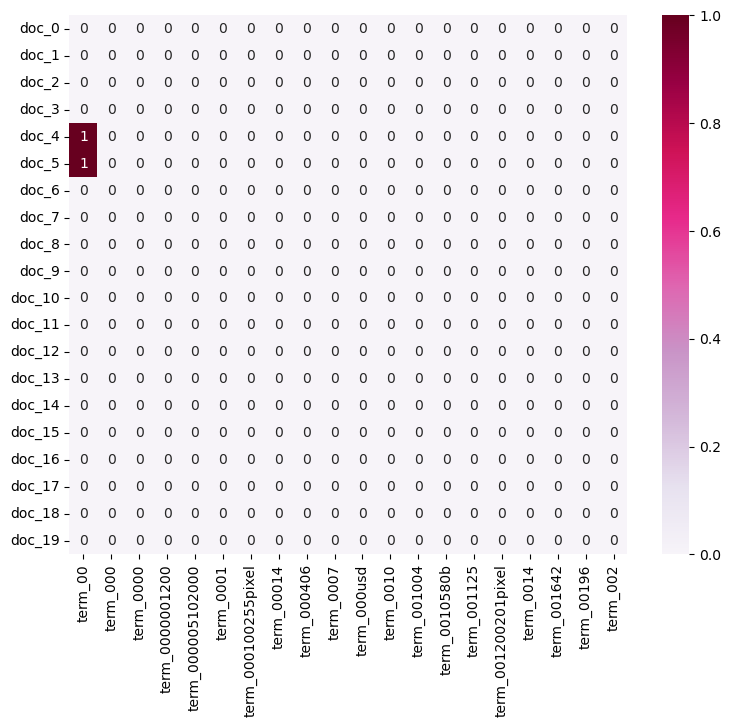

In [30]:
df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                cmap="PuRd",
                vmin=0, vmax=1, annot=True)

***From the chart above, we can see how sparse the term-document matrix is; i.e., there is only one terms with FREQUENCY of 1 in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the
histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would
use to get a nice and useful visualization***

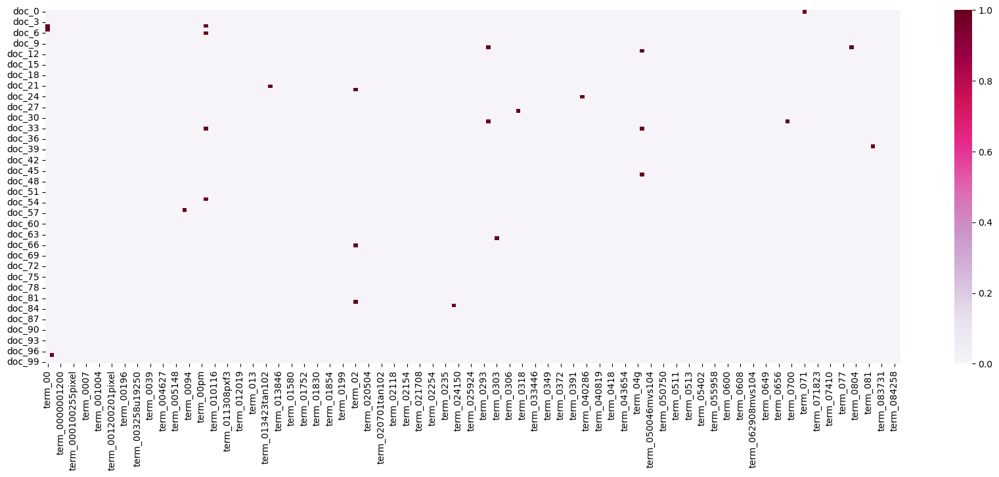

In [31]:
plot_xe = ["term_"+str(i) for i in count_vect.get_feature_names_out()[0:200]]
plot_ye = ["doc_"+ str(i) for i in list(X.index)[0:100]]
plot_ze = X_counts[0:100, 0:200].toarray()

df_todraw_e = pd.DataFrame(plot_ze, columns = plot_xe, index = plot_ye)

plt.subplots(figsize=(21, 7))

# if annot=True, write the data value in each cell
ax = sns.heatmap(df_todraw_e,
                cmap="PuRd",
                vmin=0, vmax=1, annot=False)

## Exercise 12

C:\Users\Qibing\AppData\Local\Temp\ipykernel_14232\1233523132.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);


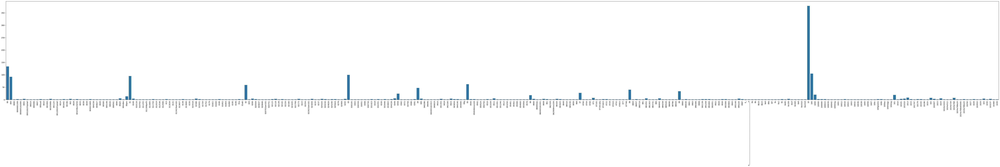

In [32]:
term_frequencies = []
for j in range(0,X_counts.shape[1]):
    term_frequencies.append(sum(X_counts[:,j].toarray()))
    
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]

plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300],
        y=term_frequencies[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

***If you want a nicer interactive visualization here, I would encourage you try to install and use plotly to achieve this***

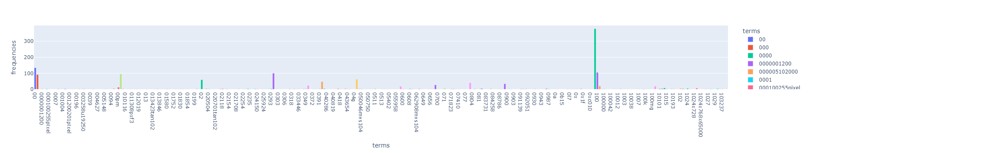

In [33]:
import plotly.express as px

# create df
pl_df = pd.DataFrame({
    'terms':count_vect.get_feature_names_out()[:300], 
    'frequencies':term_frequencies[:300]
})

# visualization
fig = px.bar(
    pl_df, 
    x='terms', 
    y='frequencies', 
    color='terms'
)

fig.show()

## Exercise 13

***The chart above only contains 300 vocabulary in the documents, and it's already computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise***

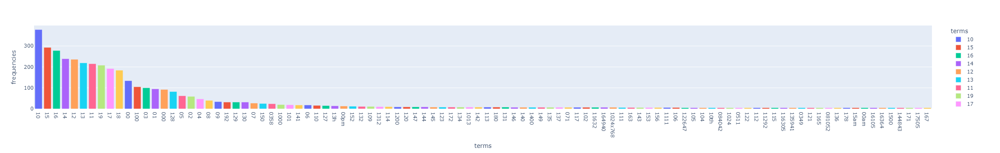

In [34]:
# create df and sort by descending
pl_df = pd.DataFrame({
    'terms':count_vect.get_feature_names_out()[:1000], 
    'frequencies':term_frequencies[:1000]
}).sort_values('frequencies', ascending=False)

# top 100 terms by frequency
fig = px.bar(
    pl_df.head(100), 
    x='terms', 
    y='frequencies', 
    color='terms'
)

fig.show()

## Exercise 14

***Additionally, you can attempt to sort the terms on the x-axis by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called long tail (get familiar with this term since it will
appear a lot in data mining and other statistics courses). see picture below***

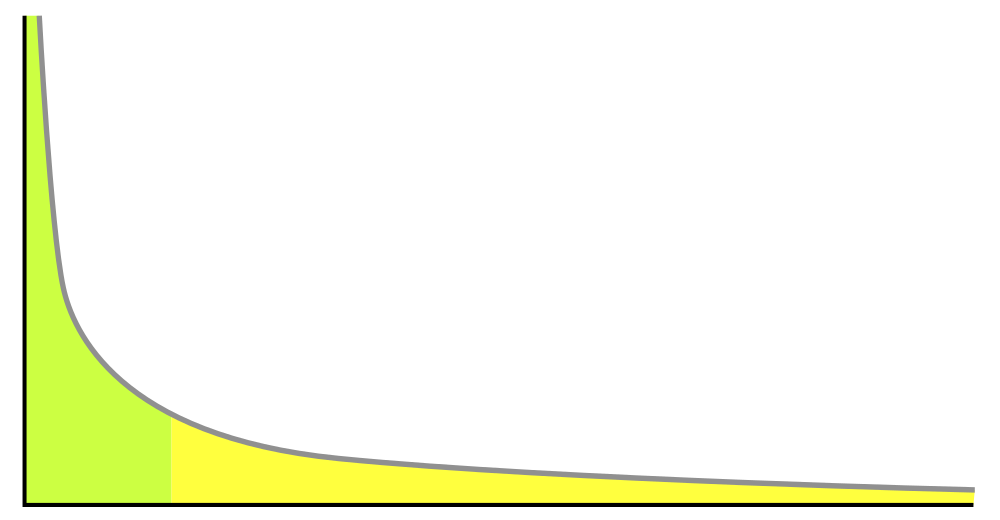

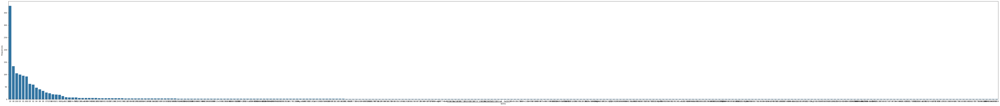

In [35]:
# seaborn
# create df and sort by descending
pl_df = pd.DataFrame({
    'terms':count_vect.get_feature_names_out()[:300], 
    'frequencies':term_frequencies[:300]
}).sort_values('frequencies', ascending=False)

# visualization
plt.subplots(figsize=(100, 10))
g = sns.barplot(pl_df, x='terms', y='frequencies')

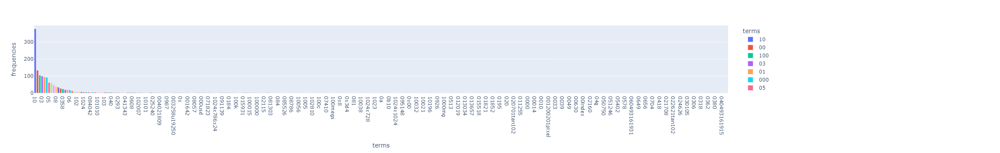

In [36]:
# plotly.express 
# create df and sort by descending
pl_df = pd.DataFrame({
    'terms':count_vect.get_feature_names_out()[:300], 
    'frequencies':term_frequencies[:300]
}).sort_values('frequencies', ascending=False)

# visualization
fig = px.bar(
    pl_df, 
    x='terms',
    y='frequencies', 
    color='terms'
)

fig.show()

## Exercise 15

C:\Users\Qibing\AppData\Local\Temp\ipykernel_14232\1667665253.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator



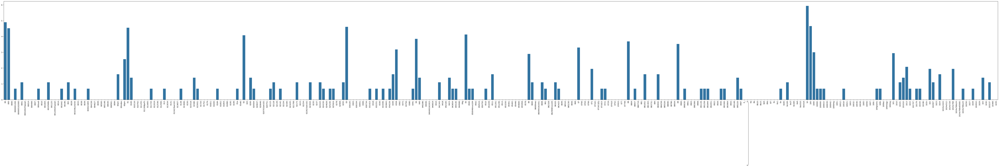

In [37]:
term_frequencies_log = [math.log(i) for i in term_frequencies]

plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300],
y=term_frequencies_log[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

***You can copy the code from the previous exercise and change the 'term_frequencies' variable for the 'term_frequencies_log', comment about the differences that you observe and talk about other possible insights that we can get from a log distribution.***

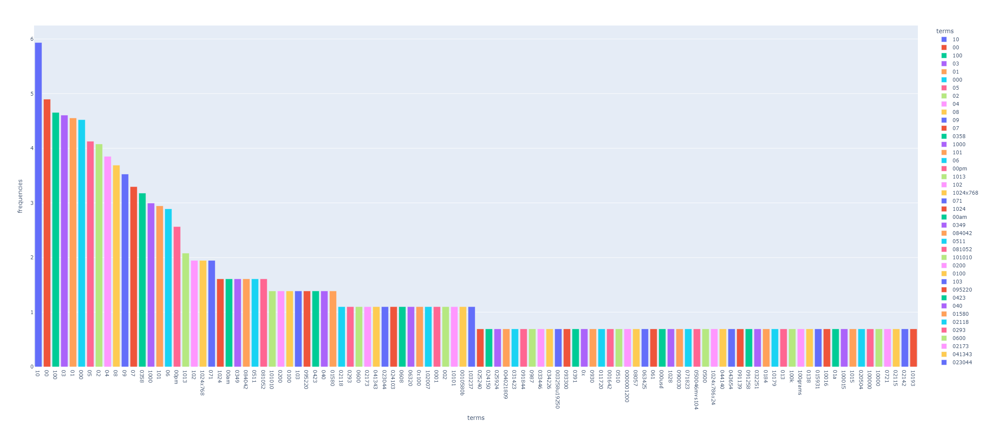

In [38]:
# create df and sort by descending
pl_df = pd.DataFrame({
    'terms':count_vect.get_feature_names_out()[:300], 
    'frequencies':term_frequencies[:300]
}).sort_values('frequencies', ascending=False)

# np.log() value of a column "frequencies"
pl_df['frequencies'] = pl_df['frequencies'].apply(lambda x: np.log(x))

# visualization
fig = px.bar(
    pl_df.query('frequencies > 0'), # remove values == 0
    x='terms',
    y='frequencies', 
    color='terms',
    width=2500,
    height=1000
)

fig.show()

## Exercise 16

In [39]:
#Create separate DataFrames for each category
categories = X['category_name'].unique() # Get unique category labels
category_dfs = {} # Dictionary to store DataFrames for each category

for category in categories:
    # Filter the original DataFrame by category
    category_dfs[category] = X[X['category_name'] == category].copy()

# Function to create term-document frequency DataFrame for each category
def create_term_document_df(df):
    count_vect = CountVectorizer() # Initialize the CountVectorizer
    X_counts = count_vect.fit_transform(df['text']) # Transform the text data into word counts

    # Get the unique words (vocabulary) from the vectorizer
    words = count_vect.get_feature_names_out()

    # Create a DataFrame where rows are documents and columns are words
    term_document_df = pd.DataFrame(X_counts.toarray(), columns=words)

    return term_document_df


# Create term-document frequency DataFrames for each category
term_document_dfs = {} # Dictionary to store term-document DataFrames for each category

for category in categories:
    term_document_dfs[category] = create_term_document_df(category_dfs[category])

In [40]:
category_number=3 #You can change it from 0 to 3
word_counts = term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices = np.argsort(word_counts) # Get indices of sorted frequencies
sorted_counts = np.sort(word_counts)[::-1] # Sort frequencies in descending order

# Calculate the index corresponding to the top 5% most frequent terms
total_terms = len(sorted_counts)
top_5_percent_index = int(0.05 * total_terms)

# Get the indices of the top 5% most frequent terms
top_5_percent_indices = sorted_indices[:top_5_percent_index]

# Filter terms that belong to the top 5% based on their rank
filtered_words = [count_vect.get_feature_names_out()[i] for i in top_5_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: alt.atheism
Number of terms in top 5%: 598
Filtered terms: ['djohnson', 'charset', 'a2x', 'a2623', 'a16pd', 'a137490', 'chassis', 'a1', 'a000', '_yourself_', '_your_', '_you_', 'chastisement', 'chastity', 'chat', '_why', '_whole_', '_whole', 'a66', 'a7d56e52', 'charlottesville', 'a7f81fd2f801023c', 'aantal_snijpunten', 'characterizes', 'aanerud', 'characterizing', 'aah', 'charge', 'aacc', 'aaai', '_which', 'aaaa', 'aa888', 'charges', 'aa17104', 'aa09923', 'charging', 'chariot', 'charism', 'charismatic', 'aaa', 'characteristics', 'chatting', '_washington', '_the', '_that_', 'chehey', 'cheinan', '_talk_', 'chelsea', 'chem', '_synners_', '_symbol_', 'chemical', 'chemicals', '_steelcollar', '_speed_', 'chemist', '_something_', '_someone', 'chemlab', 'cheeses', 'cheese', 'cheering', 'cheerful', 'chay', '_want_', 'cheat', '_used_', '_us_', '_until_', 'cheated', 'checker', 'chavey', 'checklist', 'checkman', 'checkmate', '_this_', 'checks', 'cheek', '_them_', '_their_', '_the_wholly_

In [41]:
category_number=3 #You can change it from 0 to 3
word_counts = term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in ascending order and get sorted indices
sorted_indices = np.argsort(word_counts) # Get indices of sorted frequencies
sorted_counts = word_counts[sorted_indices] # Sort frequencies

# Calculate the index corresponding to the bottom 1% least frequent terms
total_terms = len(sorted_counts)
bottom_1_percent_index = int(0.01 * total_terms)

# Get the indices of the bottom 1% least frequent terms
bottom_1_percent_indices = sorted_indices[:bottom_1_percent_index]

# Filter terms that belong to the bottom 1% based on their rank
filtered_words = [count_vect.get_feature_names_out()[i] for i in bottom_1_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: alt.atheism
Number of terms in bottom 1%: 119
Filtered terms: ['djohnson', 'charset', 'a2x', 'a2623', 'a16pd', 'a137490', 'chassis', 'a1', 'a000', '_yourself_', '_your_', '_you_', 'chastisement', 'chastity', 'chat', '_why', '_whole_', '_whole', 'a66', 'a7d56e52', 'charlottesville', 'a7f81fd2f801023c', 'aantal_snijpunten', 'characterizes', 'aanerud', 'characterizing', 'aah', 'charge', 'aacc', 'aaai', '_which', 'aaaa', 'aa888', 'charges', 'aa17104', 'aa09923', 'charging', 'chariot', 'charism', 'charismatic', 'aaa', 'characteristics', 'chatting', '_washington', '_the', '_that_', 'chehey', 'cheinan', '_talk_', 'chelsea', 'chem', '_synners_', '_symbol_', 'chemical', 'chemicals', '_steelcollar', '_speed_', 'chemist', '_something_', '_someone', 'chemlab', 'cheeses', 'cheese', 'cheering', 'cheerful', 'chay', '_want_', 'cheat', '_used_', '_us_', '_until_', 'cheated', 'checker', 'chavey', 'checklist', 'checkman', 'checkmate', '_this_', 'checks', 'cheek', '_them_', '_their_', '_the_whol

***Review the words that were filtered in each category and comment about the differences and similarities that you can see.***

## Exercise 17

Implement the FAE Top-K and MaxFPGrowth algorithms from the PAMI library to analyze the 'comp.graphics' category in our processed database. **Only implement the mining part of the algorithm and display the resulting patterns**, like we did with
the FPGrowth algorithm after creating the new databases. For the FAE Top-K, run trials with k values of 500, 1000, and 1500, recording the runtime for each. For MaxFPGrowth, test minimum support thresholds of 3, 6, and 9, noting the runtime for these
settings as well. Compare the patterns these algorithms extract with those from the previously implemented FPGrowth algorithm. Document your findings, focusing on differences and similarities in the outputs and performance.

In [42]:
from PAMI.frequentPattern.maximal import MaxFPGrowth as mfpg
from PAMI.frequentPattern.topk import FAE as fae

In [43]:
for i in range(3, 12, 3):
    print('__________________________________________________________________________________')
    obj = mfpg.MaxFPGrowth(iFile='td_freq_db_comp_graphics.csv', minSup=i)
    obj.mine()
    frequentPatternsDF_comp_graphics = obj.getPatternsAsDataFrame()
    print('minSup: ', i)
    print('Total No of patterns: ', str(len(frequentPatternsDF_comp_graphics)))
    print('Runtime: ', str(obj.getRuntime()))
    print(frequentPatternsDF_comp_graphics)

__________________________________________________________________________________
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
minSup:  3
Total No of patterns:  6872
Runtime:  23.75656485557556
                                               Patterns  Support
0     due bytes responsible 000 opinion 640x480 rob ...        3
1                                                  bag         3
2                                          garbo uwasa         3
3             wrong 200 responsible 000 umn 480 640 tc         3
4                                responsible 000 essex         3
...                                                 ...      ...
6867                                    didn wondering         3
6868                             feel wrong personally         3
6869                                     wrong correct         3
6870                                      life correct         3
6871                                        maybe l

In [44]:
for i in range(500, 2000, 500):
    print('_______________________________________________________________________')
    obj = fae.FAE(iFile='td_freq_db_comp_graphics.csv', k=i)
    obj.mine()
    frequentPatternsDF_comp_graphics = obj.getPatternsAsDataFrame()
    print('FAE Top-K with k: ', i)
    print('Total No of patterns: ', str(len(frequentPatternsDF_comp_graphics)))
    print('Runtime: ', str(obj.getRuntime()))
    print(frequentPatternsDF_comp_graphics)

_______________________________________________________________________
 TopK frequent patterns were successfully generated using FAE algorithm.
FAE Top-K with k:  500
Total No of patterns:  500
Runtime:  0.8829207420349121
                                              Patterns  Support
0                                                maybe       26
1                                                 life       24
2                                                ideas       24
3                                                 feel       24
4                                                tried       24
..                                                 ...      ...
495  awful posts curious concerning proposed learn ...       12
496  posts curious concerning proposed learn forum ...       12
497  convenience posts curious concerning proposed ...       12
498  posts curious concerning proposed learn forum ...       12
499  posts curious concerning proposed learn forum ...       12

[500 ro

## Exercise 18

In [45]:
minSup=9
obj1 = alg.FPGrowth(iFile='td_freq_db_sci_med.csv', minSup=minSup)
obj1.mine()
frequentPatternsDF_sci_med= obj1.getPatternsAsDataFrame()

minSup=9
obj2 = alg.FPGrowth(iFile='td_freq_db_alt_atheism.csv', minSup=minSup)
obj2.mine()
frequentPatternsDF_alt_atheism= obj2.getPatternsAsDataFrame()

minSup=9
obj3 = alg.FPGrowth(iFile='td_freq_db_comp_graphics.csv', minSup=minSup)
obj3.mine()
frequentPatternsDF_comp_graphics= obj3.getPatternsAsDataFrame()

minSup=9
obj4 = alg.FPGrowth(iFile='td_freq_db_soc_religion_christian.csv', minSup=minSup)
obj4.mine()
frequentPatternsDF_soc_religion_christian= obj4.getPatternsAsDataFrame()

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Frequent patterns were generated successfully using frequentPatternGrowth algorithm


In [46]:
#We group together all of the dataframes related to our found patterns
dfs = [frequentPatternsDF_sci_med, frequentPatternsDF_soc_religion_christian, frequentPatternsDF_comp_graphics, frequentPatternsDF_alt_atheism]

# Identify patterns that appear in more than one category
# Count how many times each pattern appears across all dataframes
pattern_counts = {}
for df in dfs:
    for pattern in df['Patterns']:
        if pattern not in pattern_counts:
            pattern_counts[pattern] = 1
        else:
            pattern_counts[pattern] += 1
            
# Filter out patterns that appear in more than one dataframe
unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}
# Calculate the total number of patterns across all categories
total_patterns_count = sum(len(df) for df in dfs)
# Calculate how many patterns were discarded
discarded_patterns_count = total_patterns_count - len(unique_patterns)

# For each category, filter the patterns to keep only the unique ones
filtered_dfs = []
for df in dfs:
    filtered_df = df[df['Patterns'].isin(unique_patterns)]
    filtered_dfs.append(filtered_df)
    
# Merge the filtered dataframes into a final dataframe
final_pattern_df = pd.concat(filtered_dfs, ignore_index=True)

# Sort by support
final_pattern_df = final_pattern_df.sort_values(by='Support', ascending=False)

In [50]:
# Convert 'text' column into term-document matrix using CountVectorizer
count_vect = CountVectorizer()
X_tdm = count_vect.fit_transform(X['text']) # X['text'] contains your text data
terms = count_vect.get_feature_names_out() # Original terms in the vocabulary

# Tokenize the sentences into sets of unique words
X['tokenized_text'] = X['text'].str.split().apply(set)

# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=X.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split()) # Tokenize pattern into words
    pattern_matrix[pattern] = X['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(X_tdm.toarray(), columns=terms, index=X.index)

KeyboardInterrupt: 

In [48]:
#This might take a couple of minutes to execute
# Apply PCA, t-SNE, and UMAP to the data
X_pca_tdm = PCA(n_components=2).fit_transform(tdm_df.values)
X_tsne_tdm = TSNE(n_components=2).fit_transform(tdm_df.values)
X_umap_tdm = umap.UMAP(n_components=2).fit_transform(tdm_df.values)

# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique()

fig, axes = plt.subplots(1, 3, figsize=(30, 10)) # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category].T[0]
        ys = X_reduced[X['category_name'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)

    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')
    
# Step 4: Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_tdm, 'PCA')
plot_scatter(axes[1], X_tsne_tdm, 't-SNE')
plot_scatter(axes[2], X_umap_tdm, 'UMAP')

plt.show()

NameError: name 'tdm_df' is not defined

In [ ]:
#This might take a couple of minutes to execute
#Applying dimensionality reduction with both the document-term frequency data and the pattern derived data
# Apply PCA, t-SNE, and UMAP to the data
X_pca_aug = PCA(n_components=2).fit_transform(augmented_df.values)
X_tsne_aug = TSNE(n_components=2).fit_transform(augmented_df.values)
X_umap_aug = umap.UMAP(n_components=2).fit_transform(augmented_df.values)



In [ ]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique()

fig, axes = plt.subplots(1, 3, figsize=(30, 10)) # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category].T[0]
        ys = X_reduced[X['category_name'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
        
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')


# Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_aug, 'PCA')
plot_scatter(axes[1], X_tsne_aug, 't-SNE')
plot_scatter(axes[2], X_umap_aug, 'UMAP')

plt.show()

***Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.***

In [ ]:
# reduce dimension to 3
X_umap_tdm_3d = umap.UMAP(n_components=3).fit_transform(tdm_df.values)
X_pca_tdm_3d = PCA(n_components=3).fit_transform(tdm_df.values)
X_tsne_tdm_3d = TSNE(n_components=3).fit_transform(tdm_df.values)

# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
categories = X['category_name'].unique() 

fig, axes = plt.subplots(3, 3, figsize=(18, 18), subplot_kw={'projection': '3d'})

fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define angles
angles = [(20, -60), (30, 30), (40, 60)]

# Define a function to create a scatter plot for each method
def plot_scatter_3d(ax, X_reduced, title):
    for i, (elev, azim) in enumerate(angles):
        for c, category  in zip(col, categories):
            xs = X_reduced[X['category_name'] == category].T[0]
            ys = X_reduced[X['category_name'] == category].T[1]
            zs = X_reduced[X['category_name'] == category].T[2]
            ax[i].scatter(xs, ys, zs, c=c, marker='o', label=category)
            
            ax[i].view_init(elev=elev, azim=azim)
            ax[i].set_title(f'{title} (elev={elev}, azim={azim})')

        ax[i].grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
        ax[i].set_xlabel('X')
        ax[i].set_ylabel('Y')
        ax[i].set_zlabel('Z')
        ax[i].legend(loc='best')


# Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter_3d(axes[0], X_pca_tdm_3d, 'PCA')
plot_scatter_3d(axes[1], X_tsne_tdm_3d, 't-SNE')
plot_scatter_3d(axes[2], X_umap_tdm_3d, 'UMAP')

plt.show()

## Exercise 19

***Try to generate the binarization using the category_name column instead. Does it work?***

In [ ]:
mlb2 = preprocessing.LabelBinarizer()
mlb2.fit(X.category_name)

X['bin_category'] = mlb2.transform(X['category_name']).tolist()

X.sample(10)

# it work

# Second Part

# 1. Dataset

In [51]:
X = pd.read_csv('Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data.csv')

In [52]:
len(X)

1500

In [53]:
X.sample(10)

,sentiment,comment
939,nostalgia,Beautiful song. Takes me back to happy days an...
855,nostalgia,As the memories come back while hearing this s...
506,not nostalgia,Is there a place called mockingbird hill it wo...
1396,nostalgia,"Oh, cool man I miss the 1980s, but don't the o..."
767,nostalgia,This song reminds me of my first boyfriend and...
1380,not nostalgia,One of those few perfect in every way love son...
778,not nostalgia,Brilliant. Makes my heart feel good. Thinking ...
1300,nostalgia,so many happy memories of my beautiful mum lis...
263,not nostalgia,True country music today country music sucks I...
1147,nostalgia,This song gives serenity to the listener and r...


# 2. Data Preparation

In [54]:
# categories
categories = ["nostalgia", "non-nostalgia"]

In [55]:
# An example of what the subset contains
print("\n".join(X.comment[0].split("\n")))

He was a singer with a golden voice that I love to hear all the time. I was his great fan at the age of 16years in those days and still now. Although we have many singers now, but, I can vouch for Jim Reeves all the time. You feel relaxed, emotional and loving. Thank you Lord for his life.


In [56]:
# category of first 10 documents.
X.sentiment[0:10]

0    not nostalgia
1        nostalgia
2        nostalgia
3    not nostalgia
4        nostalgia
5        nostalgia
6        nostalgia
7        nostalgia
8    not nostalgia
9    not nostalgia
Name: sentiment, dtype: object

# 3. Data Mining using Pandas

## 3.1 Missing Values

In [57]:
X.isnull()

,sentiment,comment
0,False,False
1,False,False
2,False,False
3,False,False
4,False,False
...,...,...
1495,False,False
1496,False,False
1497,False,False
1498,False,False


In [58]:
X.isnull().apply(lambda x: dmh.check_missing_values(x))

,sentiment,comment
0,The amoung of missing records is:,The amoung of missing records is:
1,0,0


## 3.2 Dealing with Duplicate Data

In [59]:
X.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
1495    False
1496    False
1497    False
1498    False
1499    False
Length: 1500, dtype: bool

In [60]:
sum(X.duplicated())

1

In [61]:
len(X)

1500

In [62]:
X[X.duplicated(keep=False)]

,sentiment,comment
62,not nostalgia,never heard this song before... WOW What an am...
78,not nostalgia,never heard this song before... WOW What an am...


In [63]:
X.drop_duplicates(keep='first', inplace=True)

In [64]:
len(X)

1499

# 4. Data Preprocessing

## 4.1 Sampling

In [65]:
X_sample = X.sample(n=1000)

In [66]:
len(X_sample)

1000

In [67]:
X_sample[0:5]

,sentiment,comment
1233,not nostalgia,A romantic late afternoon walk on a the sand o...
775,not nostalgia,"Great song, great images, poor arrangement. Th..."
1224,not nostalgia,If you came here M I'm here if you decide to s...
689,nostalgia,This is a beautiful video with a great song. S...
1025,not nostalgia,What a Timeless Music.... Not now a days all n...


nostalgia        750
not nostalgia    749
Name: sentiment, dtype: int64 



<Axes: >

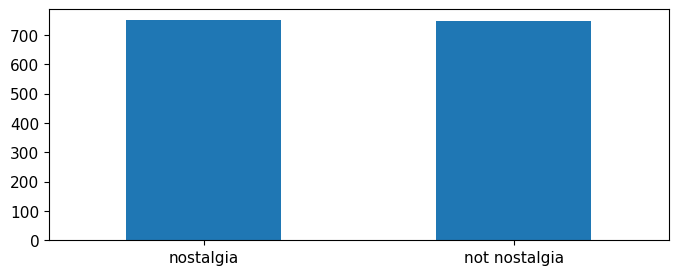

In [68]:
print(X.sentiment.value_counts(), '\n')

# plot barchart for X
X.sentiment.value_counts().plot(kind = 'bar', rot = 0, fontsize = 11, figsize = (8,3))

nostalgia        506
not nostalgia    494
Name: sentiment, dtype: int64 



<Axes: >

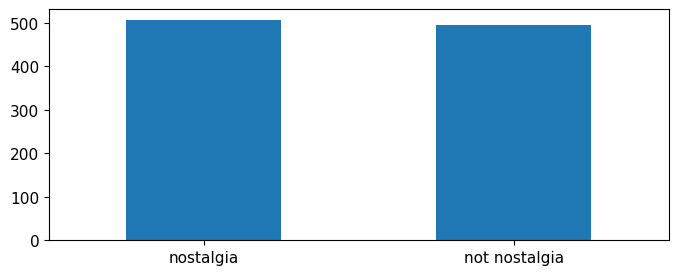

In [69]:
print(X_sample.sentiment.value_counts(), '\n')

# plot barchart for X_sample
X_sample.sentiment.value_counts().plot(kind = 'bar', rot = 0, fontsize = 11, figsize = (8,3))

<Axes: >

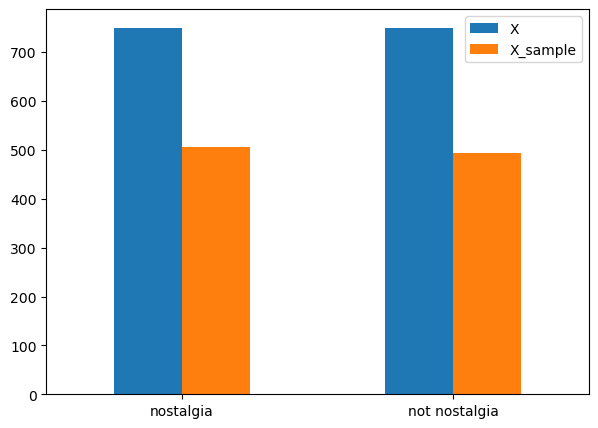

In [70]:
# concatenate 2 Series into a single DataFrame
cmp_df = pd.concat([X.sentiment.value_counts(), X_sample.sentiment.value_counts()], axis=1)

# set column names
cmp_df.columns = ['X', 'X_sample']

# plot
cmp_df.plot(kind = 'bar', rot = 0, fontsize = 10, figsize = (7,5))

## 4.2 Feature Creation

In [71]:
# takes a like a minute or two to process
X["unigrams"] = X["comment"].apply(lambda x: dmh.tokenize_text(x))

In [72]:
X[0:4]["unigrams"]

0    [He, was, a, singer, with, a, golden, voice, t...
1    [The, mist, beautiful, voice, ever, I, listene...
2    [I, have, most, of, Mr., Reeves, songs, ., Alw...
3    [30, day, leave, from, 1st, tour, in, Viet, Na...
Name: unigrams, dtype: object

In [73]:
X[0:4]

,sentiment,comment,unigrams
0,not nostalgia,He was a singer with a golden voice that I lov...,"[He, was, a, singer, with, a, golden, voice, t..."
1,nostalgia,The mist beautiful voice ever I listened to hi...,"[The, mist, beautiful, voice, ever, I, listene..."
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,"[I, have, most, of, Mr., Reeves, songs, ., Alw..."
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,"[30, day, leave, from, 1st, tour, in, Viet, Na..."


In [74]:
list(X[0:1]["unigrams"])

[['He',
  'was',
  'a',
  'singer',
  'with',
  'a',
  'golden',
  'voice',
  'that',
  'I',
  'love',
  'to',
  'hear',
  'all',
  'the',
  'time',
  '.',
  'I',
  'was',
  'his',
  'great',
  'fan',
  'at',
  'the',
  'age',
  'of',
  '16years',
  'in',
  'those',
  'days',
  'and',
  'still',
  'now',
  '.',
  'Although',
  'we',
  'have',
  'many',
  'singers',
  'now',
  ',',
  'but',
  ',',
  'I',
  'can',
  'vouch',
  'for',
  'Jim',
  'Reeves',
  'all',
  'the',
  'time',
  '.',
  'You',
  'feel',
  'relaxed',
  ',',
  'emotional',
  'and',
  'loving',
  '.',
  'Thank',
  'you',
  'Lord',
  'for',
  'his',
  'life',
  '.']]

## 4.3 Feature subset selection

In [75]:
count_vect = CountVectorizer()

X_counts = count_vect.fit_transform(
    X.comment
)  # learn the vocabulary and return document-term matrix

print(X_counts[0])

  (0, 1598)	1
  (0, 3570)	2
  (0, 2973)	1
  (0, 3650)	1
  (0, 1470)	1
  (0, 3534)	1
  (0, 3282)	1
  (0, 2028)	1
  (0, 3336)	1
  (0, 1606)	1
  (0, 233)	2
  (0, 3284)	3
  (0, 3328)	2
  (0, 1651)	2
  (0, 1512)	1
  (0, 1249)	1
  (0, 323)	1
  (0, 214)	1
  (0, 2341)	1
  (0, 15)	1
  (0, 1733)	1
  (0, 3304)	1
  (0, 907)	1
  (0, 258)	2
  (0, 3124)	1
  (0, 2328)	2
  (0, 245)	1
  (0, 3581)	1
  (0, 1591)	1
  (0, 2082)	1
  (0, 2974)	1
  (0, 573)	1
  (0, 593)	1
  (0, 3538)	1
  (0, 1347)	2
  (0, 1833)	1
  (0, 2671)	1
  (0, 3713)	2
  (0, 1272)	1
  (0, 2688)	1
  (0, 1125)	1
  (0, 2035)	1
  (0, 3278)	1
  (0, 2018)	1
  (0, 1964)	1


In [76]:
count_vect.get_feature_names_out()[1733]

'in'

In [77]:
count_vect.get_feature_names_out()[3328]

'time'

In [78]:
X_counts.shape

(1499, 3730)

In [79]:
# We can obtain the feature names of the vectorizer, i.e., the terms
# usually on the horizontal axis
count_vect.get_feature_names_out()[0:10]

array(['00', '000', '045', '07', '10', '100', '10m', '11', '11th', '12'],
      dtype=object)

In [80]:
# we convert from sparse array to normal array
X_counts[0:5, 0:100].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0,

In [81]:
# first twenty features only
plot_x = ["term_" + str(i) for i in count_vect.get_feature_names_out()[0:20]]

In [82]:
# obtain document index
plot_y = ["doc_" + str(i) for i in list(X.index)[0:20]]

In [83]:
plot_z = X_counts[0:20, 0:20].toarray()  # X_counts[how many documents, how many terms]
plot_z

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0,

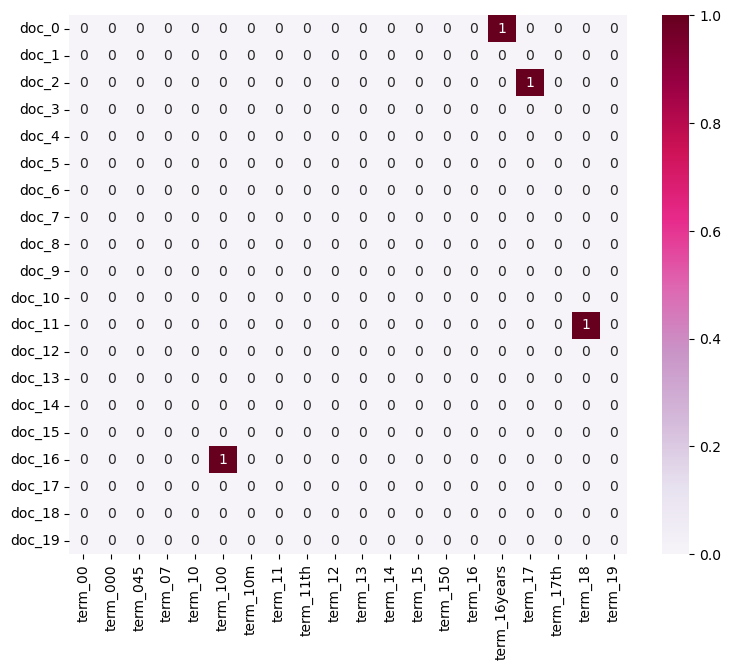

In [84]:
df_todraw = pd.DataFrame(plot_z, columns=plot_x, index=plot_y)

plt.subplots(figsize=(9, 7))

ax = sns.heatmap(df_todraw, 
                 cmap="PuRd", 
                 vmin=0, vmax=1, annot=True)

# 4.4 Attribute Transformation / Aggregation

In [85]:
# note this takes time to compute. You may want to reduce the amount of terms you want to compute frequencies for
term_frequencies = []
for j in range(0, X_counts.shape[1]):
    term_frequencies.append(sum(X_counts[:, j].toarray()))

In [86]:
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]

In [87]:
term_frequencies[0]  # sum of first term: 00

1

C:\Users\Qibing\AppData\Local\Temp\ipykernel_14232\1549152820.py:4: UserWarning:

FixedFormatter should only be used together with FixedLocator



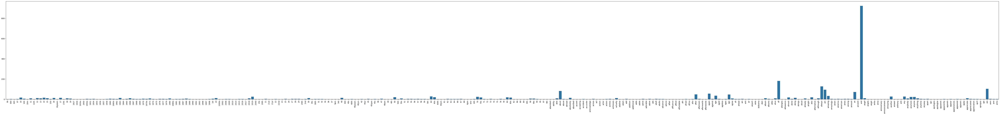

In [88]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300],
        y=term_frequencies[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

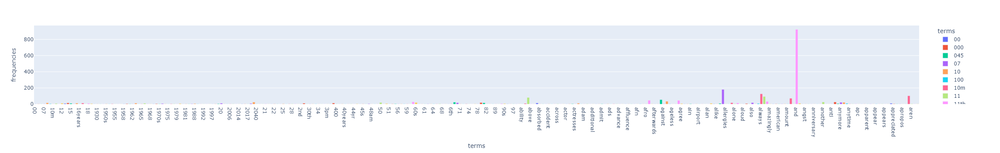

In [89]:
import plotly.express as px

# create df
pl_df = pd.DataFrame({
    'terms':count_vect.get_feature_names_out()[:300], 
    'frequencies':term_frequencies[:300]
})

# visualization
fig = px.bar(
    pl_df, 
    x='terms', 
    y='frequencies', 
    color='terms'
)

fig.show()

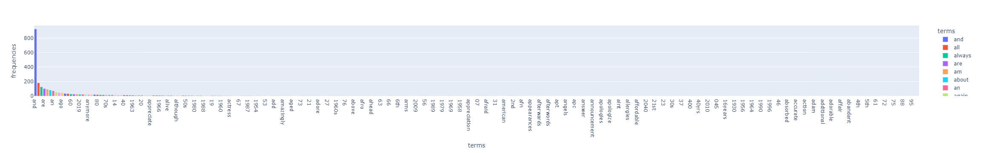

In [90]:
# plotly.express 
# create df and sort by descending
pl_df = pd.DataFrame({
    'terms':count_vect.get_feature_names_out()[:300], 
    'frequencies':term_frequencies[:300]
}).sort_values('frequencies', ascending=False)

# visualization
fig = px.bar(
    pl_df, 
    x='terms',
    y='frequencies', 
    color='terms'
)

fig.show()

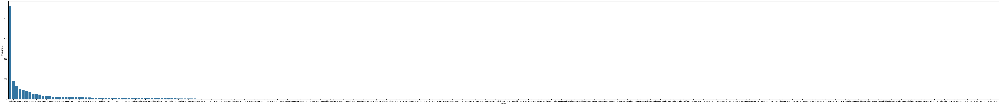

In [91]:
# seaborn
# create df and sort by descending
pl_df = pd.DataFrame({
    'terms':count_vect.get_feature_names_out()[:300], 
    'frequencies':term_frequencies[:300]
}).sort_values('frequencies', ascending=False)

# visualization
plt.subplots(figsize=(100, 10))
g = sns.barplot(pl_df, x='terms', y='frequencies')

In [92]:
term_frequencies_log = [math.log(i) for i in term_frequencies]

C:\Users\Qibing\AppData\Local\Temp\ipykernel_14232\2166548998.py:4: UserWarning:

FixedFormatter should only be used together with FixedLocator



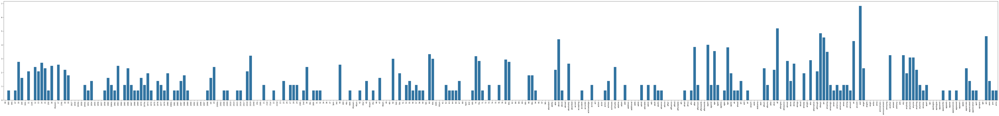

In [93]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300],
                y=term_frequencies_log[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

### Finding frequent patterns

In [94]:
#Create separate DataFrames for each category
sentiments = X['sentiment'].unique() # Get unique category labels
sentiment_dfs = {} # Dictionary to store DataFrames for each category

for sentiment in sentiments:
    # Filter the original DataFrame by category
    sentiment_dfs[sentiment] = X[X['sentiment'] == sentiment].copy()

# Function to create term-document frequency DataFrame for each category
def create_term_document_df(df):
    count_vect = CountVectorizer() # Initialize the CountVectorizer
    X_counts = count_vect.fit_transform(df['comment']) # Transform the text data into word counts

    # Get the unique words (vocabulary) from the vectorizer
    words = count_vect.get_feature_names_out()

    # Create a DataFrame where rows are documents and columns are words
    term_document_df = pd.DataFrame(X_counts.toarray(), columns=words)

    return term_document_df


# Create term-document frequency DataFrames for each category
term_document_dfs = {} # Dictionary to store term-document DataFrames for each category

for sentiment in sentiments:
    term_document_dfs[sentiment] = create_term_document_df(sentiment_dfs[sentiment])

In [95]:
# Display the filtered DataFrame for one of the categories, feel free to change the number in the vector
sentiment_number=0
print(f"Filtered Term-Document Frequency DataFrame for Category {sentiments[sentiment_number]}:")
term_document_dfs[sentiments[sentiment_number]]

Filtered Term-Document Frequency DataFrame for Category not nostalgia:


,00,000,045,10,100,10m,11,12,14,15,...,youngest,youngsters,your,yourself,youth,youtube,yrs,yuo,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


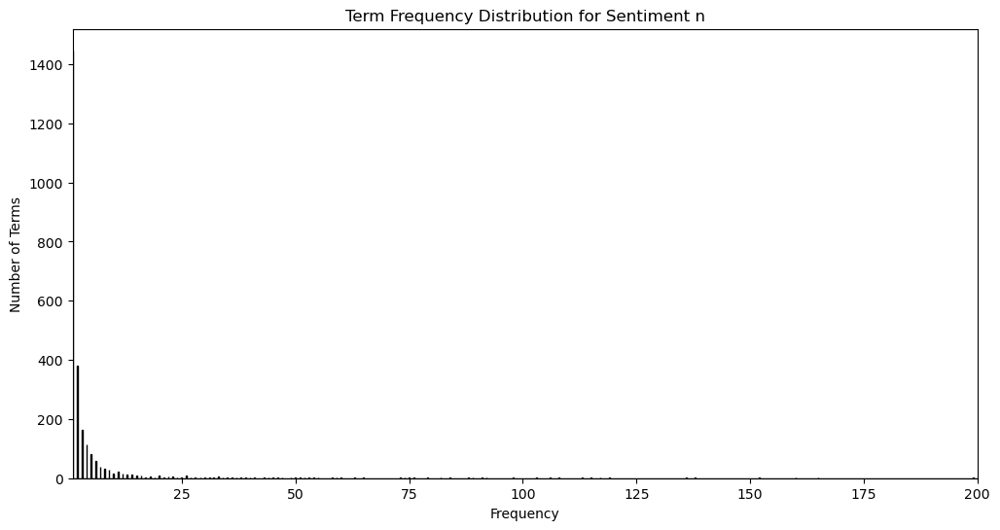

In [96]:
# Sum over all documents to get total frequency for each word
sentiment_number=0 #You can change it from 0 to 3
word_counts = term_document_dfs[sentiments[sentiment_number]].sum(axis=0).to_numpy()

# Visualize the frequency distribution
plt.figure(figsize=(12, 6))
plt.hist(word_counts, bins=5000, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for Sentiment {sentiment[sentiment_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
plt.xlim(1, 200)
plt.show()

In [97]:
category_number=3 #You can change it from 0 to 3
word_counts = term_document_dfs[sentiments[sentiment_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices = np.argsort(word_counts)[::-1]  # Get indices of sorted frequencies
sorted_counts = np.sort(word_counts)[::-1]  # Sort frequencies in descending order

# Calculate the index corresponding to the top 5% most frequent terms
total_terms = len(sorted_counts)
top_5_percent_index = int(0.05 * total_terms)

# Get the indices of the top 5% most frequent terms
top_5_percent_indices = sorted_indices[:top_5_percent_index]

# Filter terms that belong to the top 5% based on their rank
filtered_words = [term_document_dfs[sentiments[sentiment_number]].iloc[:, i].name for i in top_5_percent_indices]

print(f"Category: {sentiments[sentiment_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: not nostalgia
Number of terms in top 5%: 130
Filtered terms: ['the', 'this', 'and', 'to', 'of', 'song', 'it', 'is', 'in', 'you', 'that', 'my', 'love', 'music', 'was', 'for', 'so', 'have', 'one', 'like', 'but', 'he', 'with', 'great', 'all', 'on', 'what', 'not', 'be', 'can', 'me', 'voice', 'just', 'as', 'beautiful', 'songs', 'her', 'time', 'she', 'will', 'they', 'when', 'from', 'his', 'at', 'are', 'always', 'good', 'no', 'know', 'now', 'never', 'much', 'about', 'who', 'really', 'if', 'we', 'more', 'best', 'ever', 'by', 'thank', 'think', 'would', 'only', 'how', 'don', 'still', 'has', 'very', 'there', 'am', 'out', 'him', 'these', 'could', 'up', 'old', 'hear', 'do', 'listen', 'an', 'singer', 'had', 'many', 'here', 'such', 'version', 'too', 'today', 'been', 'most', 'get', 'your', 'people', 'world', 'heard', 'man', 'video', 'some', 'sing', 'listening', 'real', 'years', 'were', 'than', 'singing', 'heart', 'nice', 'their', 'better', 'life', 'day', 'its', 'then', 'way', 'sad', 'those',

In [98]:
category_number=3 #You can change it from 0 to 3
word_counts = term_document_dfs[sentiments[sentiment_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in ascending order and get sorted indices
sorted_indices = np.argsort(word_counts)  # Get indices of sorted frequencies
sorted_counts = word_counts[sorted_indices]  # Sort frequencies

# Calculate the index corresponding to the bottom 1% least frequent terms
total_terms = len(sorted_counts)
bottom_1_percent_index = int(0.01 * total_terms)

# Get the indices of the bottom 1% least frequent terms
bottom_1_percent_indices = sorted_indices[:bottom_1_percent_index]

# Filter terms that belong to the bottom 1% based on their rank
filtered_words = [term_document_dfs[sentiments[sentiment_number]].iloc[:, i].name for i in bottom_1_percent_indices]

print(f"Category: {sentiments[sentiment_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: not nostalgia
Number of terms in bottom 1%: 26
Filtered terms: ['00', 'montgomery', 'money', 'monday', 'moments', 'mocking', 'mock', 'mitch', 'misunderstood', 'minute', 'minds', 'miller', 'monumental', 'millennium', 'miles', 'microphone', 'miami', 'meta', 'mess', 'merle', 'mendes', 'mended', 'melting', 'melt', 'melodica', 'milestone']


In [99]:
category_number=0 #You can change it from 0 to 3

# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    # Calculate the sum of each word across all documents
    word_sums = term_document_df.sum(axis=0)

    # Sort the words by their total sum
    sorted_words = word_sums.sort_values()
    
    # Calculate the number of words to remove
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    # Get the words to remove from the top 5% and bottom 1%
    words_to_remove = pd.concat([sorted_words.head(bottom_n), sorted_words.tail(top_n)]).index

    # Return the DataFrame without the filtered words
    return term_document_df.drop(columns=words_to_remove)


# Apply the filtering function to each category
filtered_term_document_dfs = {}

for sentiment in sentiments:
    filtered_term_document_dfs[sentiment] = filter_top_bottom_words_by_sum(term_document_dfs[sentiment])
    
term_document_dfs=filtered_term_document_dfs
# Example: Display the filtered DataFrame for one of the categories
print(f"Filtered Term-Document Frequency DataFrame for Category {sentiments[sentiment_number]}:")
filtered_term_document_dfs[sentiments[sentiment_number]]

Filtered Term-Document Frequency DataFrame for Category not nostalgia:


,000,045,10,100,10m,11,12,14,15,150,...,younger,youngest,youngsters,yourself,youth,youtube,yrs,yuo,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [100]:
from PAMI.extras.DF2DB import DenseFormatDF as db

for sentiment in term_document_dfs:
    # Replace dots with underscores in the category name to avoid errors in the file creation
    category_safe = sentiment.replace('.', '_')

    # Create the DenseFormatDF object and convert to a transactional database
    obj = db.DenseFormatDF(term_document_dfs[sentiment])
    obj.convert2TransactionalDatabase(f'td_freq_db_{sentiment}.csv', '>=', 1)

Database size (total no of transactions) : 734
Number of items : 2159
Minimum Transaction Size : 1
Average Transaction Size : 8.693460490463215
Maximum Transaction Size : 39
Standard Deviation Transaction Size : 7.213372063492091
Variance in Transaction Sizes : 52.103722524357735
Sparsity : 0.9959733855996001


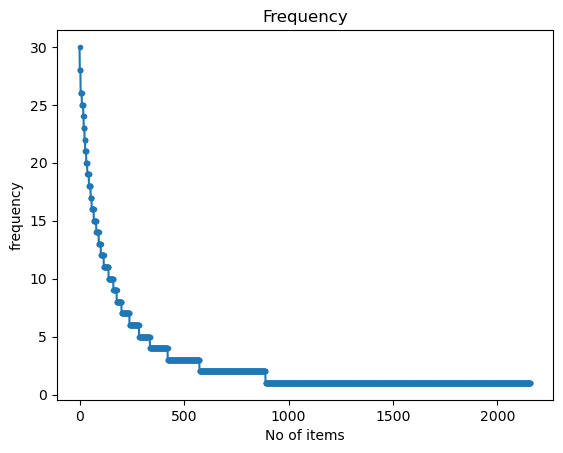

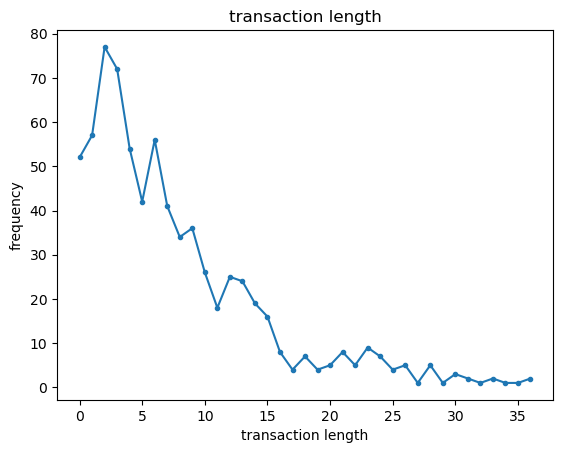

In [101]:
obj = tds.TransactionalDatabase('td_freq_db_nostalgia.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

Database size (total no of transactions) : 745
Number of items : 2446
Minimum Transaction Size : 1
Average Transaction Size : 8.410738255033557
Maximum Transaction Size : 46
Standard Deviation Transaction Size : 5.926429722323316
Variance in Transaction Sizes : 35.16977700801039
Sparsity : 0.9965614316210002


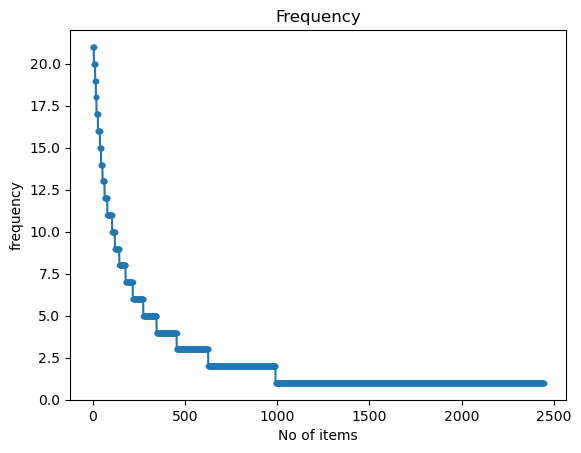

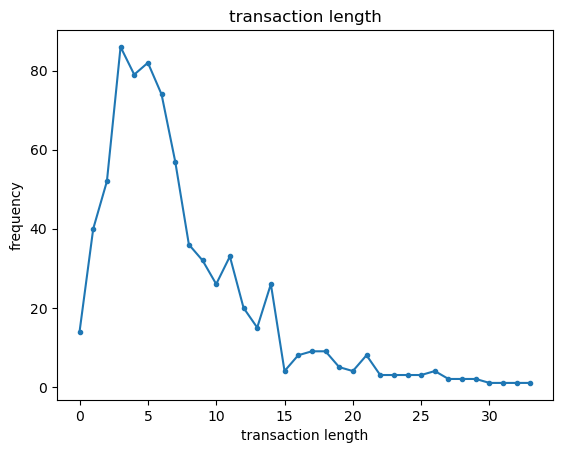

In [102]:
obj = tds.TransactionalDatabase('td_freq_db_not nostalgia.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

In [103]:
minSup=9
obj1 = alg.FPGrowth(iFile='td_freq_db_nostalgia.csv', minSup=minSup)
obj1.mine()
frequentPatternsDF_nostalgia= obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_nostalgia))) #print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 180
Runtime: 0.009999752044677734


In [104]:
obj1.save('freq_patterns_nostalgia.txt') #save the patterns
frequentPatternsDF_nostalgia

,Patterns,Support
0,find,9
1,down,9
2,few,9
3,its,9
4,sure,9
...,...,...
175,ever,28
176,would,28
177,will,28
178,go,28


In [105]:
minSup=9
obj2 = alg.FPGrowth(iFile='td_freq_db_not nostalgia.csv', minSup=minSup)
obj2.mine()
frequentPatternsDF_not_nostalgia= obj2.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_not_nostalgia))) #print the total number of patterns
print('Runtime: ' + str(obj2.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 144
Runtime: 0.006481170654296875


In [106]:
obj2.save('freq_patterns_not_nostalgia.txt') #save the patterns
frequentPatternsDF_not_nostalgia

,Patterns,Support
0,favorites,9
1,special,9
2,soul,9
3,mind,9
4,60,9
...,...,...
139,every,21
140,loved,21
141,classic,21
142,them,21


In [107]:
#We group together all of the dataframes related to our found patterns
dfs = [frequentPatternsDF_nostalgia, frequentPatternsDF_not_nostalgia]


# Identify patterns that appear in more than one category
# Count how many times each pattern appears across all dataframes
pattern_counts = {}
for df in dfs:
    for pattern in df['Patterns']:
        if pattern not in pattern_counts:
            pattern_counts[pattern] = 1
        else:
            pattern_counts[pattern] += 1

# Filter out patterns that appear in more than one dataframe
unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}
# Calculate the total number of patterns across all categories
total_patterns_count = sum(len(df) for df in dfs)
# Calculate how many patterns were discarded
discarded_patterns_count = total_patterns_count - len(unique_patterns)

# For each category, filter the patterns to keep only the unique ones
filtered_dfs = []
for df in dfs:
    filtered_df = df[df['Patterns'].isin(unique_patterns)]
    filtered_dfs.append(filtered_df)

# Merge the filtered dataframes into a final dataframe
final_pattern_df = pd.concat(filtered_dfs, ignore_index=True)

# Sort by support
final_pattern_df = final_pattern_df.sort_values(by='Support', ascending=False)

# Display the final result
print(final_pattern_df)
# Print the number of discarded patterns
print(f"Number of patterns discarded: {discarded_patterns_count}")

     Patterns  Support
127      will       28
126     would       28
125      ever       28
123        or       26
120       kid       26
..        ...      ...
142  handsome        9
143   perfect        9
144        ll        9
145     happy        9
0         its        9

[220 rows x 2 columns]
Number of patterns discarded: 104


In [108]:
count_vect = CountVectorizer()
X_tdm = count_vect.fit_transform(X['comment'])
terms = count_vect.get_feature_names_out()

# Tokenize the sentences into sets of unique words
X['tokenized_comment'] = X['comment'].str.split().apply(set)

# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=X.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = X['tokenized_comment'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(X_tdm.toarray(), columns=terms, index=X.index)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)

augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,please,though,wonder,person,sung,handsome,perfect,ll,happy,its
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [109]:
from PAMI.frequentPattern.maximal import MaxFPGrowth as mfpg
from PAMI.frequentPattern.topk import FAE as fae

In [110]:
for i in range(3, 12, 3):
    print('__________________________________________________________________________________')
    obj = mfpg.MaxFPGrowth(iFile='td_freq_db_nostalgia.csv', minSup=i)
    obj.mine()
    frequentPatternsDF_comp_graphics = obj.getPatternsAsDataFrame()
    print('minSup: ', i)
    print('Total No of patterns: ', str(len(frequentPatternsDF_comp_graphics)))
    print('Runtime: ', str(obj.getRuntime()))
    print(frequentPatternsDF_comp_graphics)

__________________________________________________________________________________
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
minSup:  3
Total No of patterns:  682
Runtime:  0.027769804000854492
           Patterns  Support
0          skating         3
1           walker         3
2            scott         3
3          17 1987         3
4             stop         3
..              ...      ...
677      will such         4
678      ever only         3
679     would only         4
680       ever kid         3
681  favorite will         3

[682 rows x 2 columns]
__________________________________________________________________________________
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
minSup:  6
Total No of patterns:  274
Runtime:  0.01599907875061035
      Patterns  Support
0        1973         6
1     looking         6
2    actually         6
3        fast         6
4    innocent         6
..         ..

In [111]:
for i in range(100, 500, 100):
    print('_______________________________________________________________________')
    obj = fae.FAE(iFile='td_freq_db_nostalgia.csv', k=i)
    obj.mine()
    frequentPatternsDF_comp_graphics = obj.getPatternsAsDataFrame()
    print('FAE Top-K with k: ', i)
    print('Total No of patterns: ', str(len(frequentPatternsDF_comp_graphics)))
    print('Runtime: ', str(obj.getRuntime()))
    print(frequentPatternsDF_comp_graphics)

_______________________________________________________________________
 TopK frequent patterns were successfully generated using FAE algorithm.
FAE Top-K with k:  100
Total No of patterns:  100
Runtime:  0.008999109268188477
    Patterns  Support
0   favorite       30
1       ever       28
2      would       28
3       will       28
4         go       28
..       ...      ...
95     while       13
96      last       13
97        10       13
98      eyes       13
99    lyrics       13

[100 rows x 2 columns]
_______________________________________________________________________
 TopK frequent patterns were successfully generated using FAE algorithm.
FAE Top-K with k:  200
Total No of patterns:  200
Runtime:  0.014000177383422852
     Patterns  Support
0    favorite       30
1        ever       28
2       would       28
3        will       28
4          go       28
..        ...      ...
195      mind        8
196   another        8
197    better        8
198        12        8
199    

## 4.5 Dimensionality Reduction

In [112]:
#This might take a couple of minutes to execute
# Apply PCA, t-SNE, and UMAP to the data
X_umap_tdm = umap.UMAP(n_components=2).fit_transform(tdm_df.values)
X_pca_tdm = PCA(n_components=2).fit_transform(tdm_df.values)
X_tsne_tdm = TSNE(n_components=2).fit_transform(tdm_df.values)

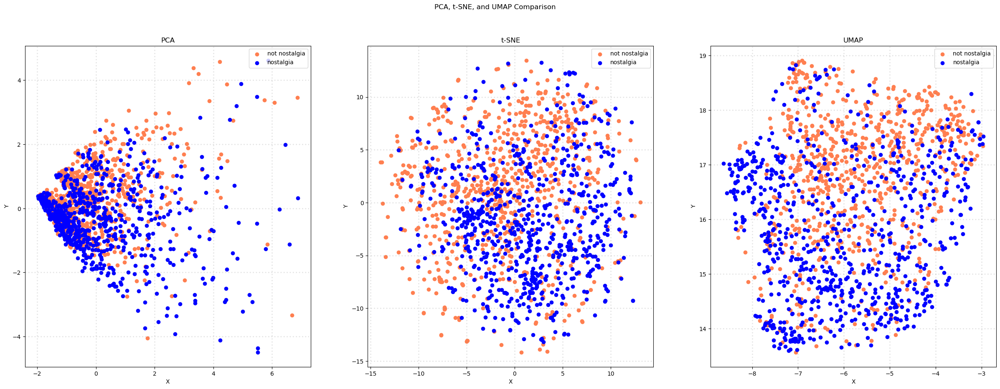

In [113]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
sentiments = X['sentiment'].unique()

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, s in zip(col, sentiments):
        xs = X_reduced[X['sentiment'] == s].T[0]
        ys = X_reduced[X['sentiment'] == s].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=s)

    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Step 4: Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_tdm, 'PCA')
plot_scatter(axes[1], X_tsne_tdm, 't-SNE')
plot_scatter(axes[2], X_umap_tdm, 'UMAP')

plt.show()

In [114]:
#This might take a couple of minutes to execute
#Applying dimensionality reduction with both the document-term frequency data and the pattern derived data
# Apply PCA, t-SNE, and UMAP to the data
X_pca_aug = PCA(n_components=2).fit_transform(augmented_df.values)
X_tsne_aug = TSNE(n_components=2).fit_transform(augmented_df.values)
X_umap_aug = umap.UMAP(n_components=2).fit_transform(augmented_df.values)

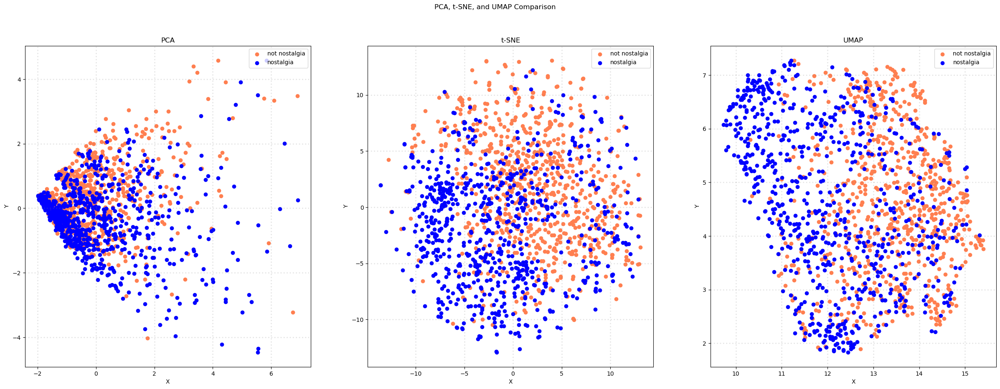

In [115]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
sentiments = X['sentiment'].unique()

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, s in zip(col, sentiments):
        xs = X_reduced[X['sentiment'] == s].T[0]
        ys = X_reduced[X['sentiment'] == s].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=s)

    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_aug, 'PCA')
plot_scatter(axes[1], X_tsne_aug, 't-SNE')
plot_scatter(axes[2], X_umap_aug, 'UMAP')

plt.show()

In [116]:
X_umap_tdm_3d = umap.UMAP(n_components=3).fit_transform(tdm_df.values)
X_pca_tdm_3d = PCA(n_components=3).fit_transform(tdm_df.values)
X_tsne_tdm_3d = TSNE(n_components=3).fit_transform(tdm_df.values)

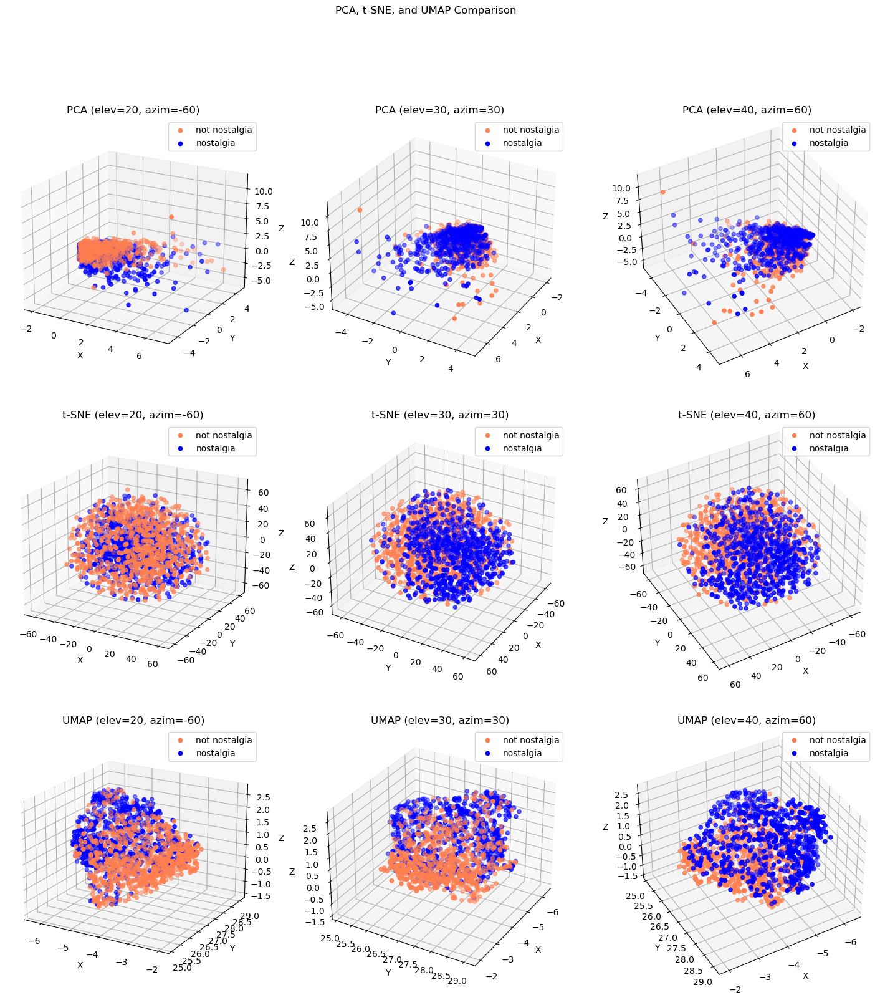

In [117]:
# Plot the results in subplots
col = ['coral', 'blue', 'black', 'orange']
sentiments = X['sentiment'].unique()

fig, axes = plt.subplots(3, 3, figsize=(18, 18), subplot_kw={'projection': '3d'})

fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define angles
angles = [(20, -60), (30, 30), (40, 60)]

# Define a function to create a scatter plot for each method
def plot_scatter_3d(ax, X_reduced, title):
    for i, (elev, azim) in enumerate(angles):
        for c, s in zip(col, sentiments):
            xs = X_reduced[X['sentiment'] == s].T[0]
            ys = X_reduced[X['sentiment'] == s].T[1]
            zs = X_reduced[X['sentiment'] == s].T[2]
            ax[i].scatter(xs, ys, zs, c=c, marker='o', label=s)
            ax[i].view_init(elev=elev, azim=azim)
            ax[i].set_title(f'{title} (elev={elev}, azim={azim})')

        ax[i].grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
        ax[i].set_xlabel('X')
        ax[i].set_ylabel('Y')
        ax[i].set_zlabel('Z')
        ax[i].legend(loc='upper right')


# Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter_3d(axes[0], X_pca_tdm_3d, 'PCA')
plot_scatter_3d(axes[1], X_tsne_tdm_3d, 't-SNE')
plot_scatter_3d(axes[2], X_umap_tdm_3d, 'UMAP')

plt.show()

## 4.6 Discretization and Binarization

In [118]:
mlb = preprocessing.LabelBinarizer()
mlb.fit(X.sentiment)

LabelBinarizer()

In [119]:
X['bin_sentiment'] = mlb.transform(X['sentiment'])

In [120]:
X[0:9]

,sentiment,comment,unigrams,tokenized_comment,bin_sentiment
0,not nostalgia,He was a singer with a golden voice that I lov...,"[He, was, a, singer, with, a, golden, voice, t...","{love, golden, and, Reeves, many, Although, si...",1
1,nostalgia,The mist beautiful voice ever I listened to hi...,"[The, mist, beautiful, voice, ever, I, listene...","{listened, love, angel, and, forgotten, when, ...",0
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,"[I, have, most, of, Mr., Reeves, songs, ., Alw...","{love, pretensions, and, had, gentle,, my, sou...",0
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,"[30, day, leave, from, 1st, tour, in, Viet, Na...","{tour, blessing, Viet, and, came, day, my, hop...",1
4,nostalgia,listening to his songs reminds me of my mum wh...,"[listening, to, his, songs, reminds, me, of, m...","{played, listening, mum, him, my, reminds, son...",0
5,nostalgia,"Every time I heard this song as a child, I use...","[Every, time, I, heard, this, song, as, a, chi...","{souls., cry....because, me, funerals., many, ...",0
6,nostalgia,"My dad loved listening to Jim Reeves, when I w...","[My, dad, loved, listening, to, Jim, Reeves, ,...","{listening, My, me, teenager, then,, when, dad...",0
7,nostalgia,i HAVE ALSO LISTENED TO Jim Reeves since child...,"[i, HAVE, ALSO, LISTENED, TO, Jim, Reeves, sin...","{love, and, am, me, ALSO, Reeves, ., music., a...",0
8,not nostalgia,Wherever you are you always in my heart,"[Wherever, you, are, you, always, in, my, heart]","{in, my, are, Wherever, you, heart, always}",1


# 5. Data Exploration

In [121]:
# We retrieve 3 sentences for a random record
comment_to_transform_1 = []
random_record_1 = X.iloc[50]
random_record_1 = random_record_1['comment']
comment_to_transform_1.append(random_record_1)

comment_to_transform_2 = []
random_record_2 = X.iloc[100]
random_record_2 = random_record_2['comment']
comment_to_transform_2.append(random_record_2)

comment_to_transform_3 = []
random_record_3 = X.iloc[150]
random_record_3 = random_record_3['comment']
comment_to_transform_3.append(random_record_3)

In [122]:
print(comment_to_transform_1)
print(comment_to_transform_2)
print(comment_to_transform_3)

['If I remember correctly, this song came out after Mr. Reeves passed away. I was about 10 years old when the disc jockey said that the news just came over the wire that he died in a plane crash.']
['i guess most of us leave it too late before we tell someone just how much we really love them']
['my name is thomas but know by tommy and my wifes name is laura and i always sing this to her']


In [123]:
# Transform sentence with Vectorizers
comment_vector_count_1 = count_vect.transform(comment_to_transform_1)
comment_vector_count_2 = count_vect.transform(comment_to_transform_2)
comment_vector_count_3 = count_vect.transform(comment_to_transform_3)

# Binarize vectors to simplify: 0 for abscence, 1 for prescence
comment_vector_count_1_bin = binarize(comment_vector_count_1)
comment_vector_count_2_bin = binarize(comment_vector_count_2)
comment_vector_count_3_bin = binarize(comment_vector_count_3)

# print vectors
print("Let's take a look at the count vectors:")
print(comment_vector_count_1.todense())
print(comment_vector_count_2.todense())
print(comment_vector_count_3.todense())

Let's take a look at the count vectors:
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [124]:
# Calculate Cosine Similarity
cos_sim_count_1_2 = cosine_similarity(comment_vector_count_1, comment_vector_count_2, dense_output=True)
cos_sim_count_1_3 = cosine_similarity(comment_vector_count_1, comment_vector_count_3, dense_output=True)
cos_sim_count_2_3 = cosine_similarity(comment_vector_count_2, comment_vector_count_3, dense_output=True)

cos_sim_count_1_1 = cosine_similarity(comment_vector_count_1, comment_vector_count_1, dense_output=True)
cos_sim_count_2_2 = cosine_similarity(comment_vector_count_2, comment_vector_count_2, dense_output=True)
cos_sim_count_3_3 = cosine_similarity(comment_vector_count_3, comment_vector_count_3, dense_output=True)

# Print
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2.item()})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3.item()})
print("Cosine Similarity using count bw 2 and 3: %(x)f" %{"x":cos_sim_count_2_3.item()})

print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1.item()})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2.item()})
print("Cosine Similarity using count bw 3 and 3: %(x)f" %{"x":cos_sim_count_3_3.item()})

Cosine Similarity using count bw 1 and 2: 0.032174
Cosine Similarity using count bw 1 and 3: 0.027864
Cosine Similarity using count bw 2 and 3: 0.000000
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000
Cosine Similarity using count bw 3 and 3: 1.000000


# 6. Data Classification

In [125]:
# Create a mapping from numerical labels to category names
sentiment_mapping = dict(X[['bin_sentiment', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [sentiment_mapping[label] for label in sorted(sentiment_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(tdm_df, X['bin_sentiment'], test_size=0.3, random_state=42)

In [126]:
X_train

,00,000,045,07,10,100,10m,11,11th,12,...,yours,yourself,youth,youthful,youtube,yrs,yuo,yup,zealand,zulus
486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
528,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
200,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
890,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
845,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1131,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1295,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
861,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1460,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [127]:
X_test

,00,000,045,07,10,100,10m,11,11th,12,...,yours,yourself,youth,youthful,youtube,yrs,yuo,yup,zealand,zulus
1117,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1396,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
423,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
414,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
452,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1084,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
991,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
651,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
1188,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [128]:
# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8688888888888889

Classification Report:
                precision    recall  f1-score   support

    nostalgia     0.8222    0.9528    0.8827       233
not nostalgia     0.9389    0.7788    0.8514       217

     accuracy                         0.8689       450
    macro avg     0.8806    0.8658    0.8670       450
 weighted avg     0.8785    0.8689    0.8676       450



In [129]:
# Create a mapping from numerical labels to category names
sentiment_mapping = dict(X[['bin_sentiment', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [sentiment_mapping[label] for label in sorted(sentiment_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, X['bin_sentiment'], test_size=0.3, random_state=42)

In [130]:
X_train

,00,000,045,07,10,100,10m,11,11th,12,...,please,though,wonder,person,sung,handsome,perfect,ll,happy,its
486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
528,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
200,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
890,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
845,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1131,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1295,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
861,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1460,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [131]:
X_test

,00,000,045,07,10,100,10m,11,11th,12,...,please,though,wonder,person,sung,handsome,perfect,ll,happy,its
1117,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1396,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
423,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
414,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
452,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1084,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
991,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
651,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1188,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [132]:
# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8644444444444445

Classification Report:
                precision    recall  f1-score   support

    nostalgia     0.8185    0.9485    0.8787       233
not nostalgia     0.9333    0.7742    0.8463       217

     accuracy                         0.8644       450
    macro avg     0.8759    0.8613    0.8625       450
 weighted avg     0.8739    0.8644    0.8631       450



# Third Part

## New data visualizations

In [133]:
df3 = pd.read_csv('Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data.csv')

In [134]:
# split data by sentiment
nostalgia_comments = df3[df3['sentiment'] == 'nostalgia']['comment'].tolist()
not_nostalgia_comments = df3[df3['sentiment'] == 'not nostalgia']['comment'].tolist()

In [135]:
# tokenize and count word frequencies
def tokenize(text_list):
    
    # Combine all comments into one text
    combined_text = " ".join(text_list).lower()

    # Remove non-alphabetic characters and split by whitespace
    combined_text = combined_text.translate(str.maketrans('', '', string.punctuation))

    tokens = combined_text.split()

    return tokens

In [136]:
nostalgia_tokens = tokenize(nostalgia_comments)
not_nostalgia_tokens = tokenize(not_nostalgia_comments)

In [137]:
# get word frequencies for each category
nostalgia_word_counts = Counter(nostalgia_tokens)
not_nostalgia_word_counts = Counter(not_nostalgia_tokens)

# Identify and filter common words
common_words = set(nostalgia_word_counts.keys()).intersection(set(not_nostalgia_word_counts.keys()))

In [138]:
# create word clouds excluding common words
def generate_wordcloud(tokens, common_words, title):
    
    # Filter tokens to exclude common words
    filtered_tokens = [word for word in tokens if word not in common_words]
    # Convert filtered tokens back to a string
    filtered_text = " ".join(filtered_tokens)

    # Generate word cloud
    wordcloud = WordCloud(stopwords=common_words, width=800, height=400, background_color='white').generate(filtered_text)

    # Plot the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

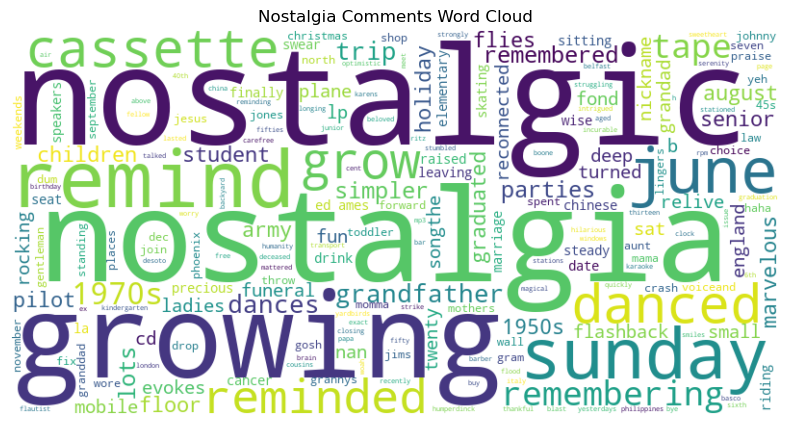

In [139]:
generate_wordcloud(nostalgia_tokens, common_words, "Nostalgia Comments Word Cloud")

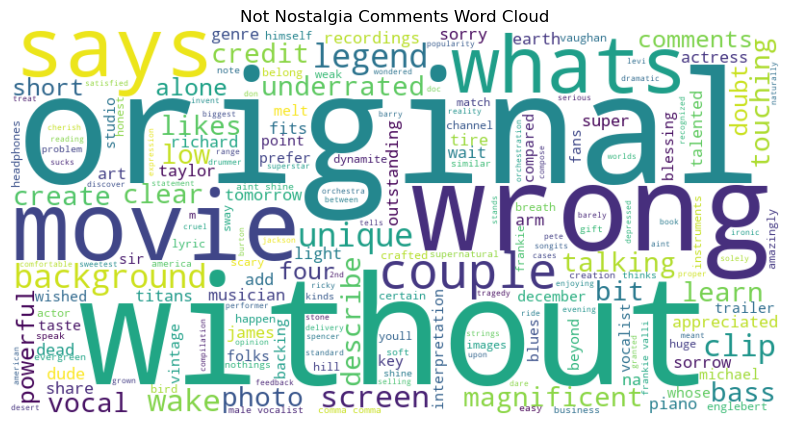

In [140]:
generate_wordcloud(not_nostalgia_tokens, common_words, "Not Nostalgia Comments Word Cloud")

## TF-IDF features

In [141]:
# prepare the text data
text_data = df3['comment'].tolist()

# initialize TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(
    max_df=0.95,     # Ignore words with a document frequency higher than 95%
    min_df=0.01,     # Ignore words with a document frequency lower than 1%
    stop_words='english'  # Remove common English stopwords
)

# fit and transform the text data to generate the TF-IDF matrix
tfidf_matrix = tfidf_vectorizer.fit_transform(text_data)

# convert TF-IDF matrix to a pandas DataFrame for easier interpretation
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# display the resulting TF-IDF DataFrame
print(tfidf_df)

       10  2019   50   60  60s   70  70s   80  80s       age  ...  words  \
0     0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.293491  ...    0.0   
1     0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ...    0.0   
2     0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.249722  ...    0.0   
3     0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ...    0.0   
4     0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ...    0.0   
...   ...   ...  ...  ...  ...  ...  ...  ...  ...       ...  ...    ...   
1495  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ...    0.0   
1496  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ...    0.0   
1497  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.476851  ...    0.0   
1498  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.616156  ...    0.0   
1499  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  ...    0.0   

      world  wow  year     years  yes  yesterday  young  youth  youtube  
0       0.0  

## Naive Bayes classifier

In [142]:
# training and testing datasets
X = df3['comment']
y = df3['sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [143]:
# Naive Bayes with Word Frequency Features
count_vectorizer = CountVectorizer(
    max_df=0.95,
    min_df=0.01,
    stop_words='english'
)

In [144]:
X_train_count = count_vectorizer.fit_transform(X_train)
X_test_count = count_vectorizer.transform(X_test)

In [145]:
mnb = MultinomialNB()
mnb.fit(X_train_count, y_train)
y_pred = mnb.predict(X_test_count)

In [146]:
print("Accuracy (Word Frequency Features):", accuracy_score(y_test, y_pred))
print("\nClassification Report (Word Frequency Features):\n", classification_report(y_test, y_pred))

Accuracy (Word Frequency Features): 0.8533333333333334

Classification Report (Word Frequency Features):
                precision    recall  f1-score   support

    nostalgia       0.83      0.89      0.86       225
not nostalgia       0.88      0.82      0.85       225

     accuracy                           0.85       450
    macro avg       0.86      0.85      0.85       450
 weighted avg       0.86      0.85      0.85       450



In [147]:
tfidf_vectorizer = TfidfVectorizer(
    max_df=0.95,
    min_df=0.01,
    stop_words='english'
)

In [148]:
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

In [149]:
gnb = GaussianNB()
gnb.fit(X_train_tfidf.toarray(), y_train)
y_pred = gnb.predict(X_test_tfidf.toarray())

In [150]:
print("Accuracy (TF-IDF Features):", accuracy_score(y_test, y_pred))
print("\nClassification Report (TF-IDF Features):\n", classification_report(y_test, y_pred))

Accuracy (TF-IDF Features): 0.8244444444444444

Classification Report (TF-IDF Features):
                precision    recall  f1-score   support

    nostalgia       0.84      0.80      0.82       225
not nostalgia       0.81      0.85      0.83       225

     accuracy                           0.82       450
    macro avg       0.83      0.82      0.82       450
 weighted avg       0.83      0.82      0.82       450

